In [3]:
import pandas as pd 
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns 
import warnings
warnings.filterwarnings('ignore')

In [4]:
data = pd.read_csv(r'C:\Users\mustafayevavb\Desktop\Data Coders\Lesson Codes\timesData.csv' , na_values= ('-',"NaN"))
# na_values= ('-',"NaN")  "-" null deyer kimi qebul edirik

In [5]:
data.head()

,world_rank,university_name,country,teaching,international,research,citations,income,total_score,num_students,student_staff_ratio,international_students,female_male_ratio,year
0,1,Harvard University,United States of America,99.7,72.4,98.7,98.8,34.5,96.1,"20,152",8.9,25%,NaN,2011
1,2,California Institute of Technology,United States of America,97.7,54.6,98.0,99.9,83.7,96.0,"2,243",6.9,27%,33 : 67,2011
2,3,Massachusetts Institute of Technology,United States of America,97.8,82.3,91.4,99.9,87.5,95.6,"11,074",9.0,33%,37 : 63,2011
3,4,Stanford University,United States of America,98.3,29.5,98.1,99.2,64.3,94.3,"15,596",7.8,22%,42 : 58,2011
4,5,Princeton University,United States of America,90.9,70.3,95.4,99.9,NaN,94.2,"7,929",8.4,27%,45 : 55,2011


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2603 entries, 0 to 2602
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   world_rank              2603 non-null   object 
 1   university_name         2603 non-null   object 
 2   country                 2603 non-null   object 
 3   teaching                2603 non-null   float64
 4   international           2594 non-null   float64
 5   research                2603 non-null   float64
 6   citations               2603 non-null   float64
 7   income                  2385 non-null   float64
 8   total_score             1201 non-null   float64
 9   num_students            2544 non-null   object 
 10  student_staff_ratio     2544 non-null   float64
 11  international_students  2536 non-null   object 
 12  female_male_ratio       2367 non-null   object 
 13  year                    2603 non-null   int64  
dtypes: float64(7), int64(1), object(6)
memor

In [7]:
data.shape

(2603, 14)

In [8]:
data['total_score'].astype('float64')  # datani yoxlamaq ucun eger cevrilirse problem yoxdur 

0       96.1
1       96.0
2       95.6
3       94.3
4       94.2
        ... 
2598     NaN
2599     NaN
2600     NaN
2601     NaN
2602     NaN
Name: total_score, Length: 2603, dtype: float64

In [9]:
data.isnull().sum()  # na_values -suz olan deyerler 

world_rank                   0
university_name              0
country                      0
teaching                     0
international                9
research                     0
citations                    0
income                     218
total_score               1402
num_students                59
student_staff_ratio         59
international_students      67
female_male_ratio          236
year                         0
dtype: int64

In [10]:
data.isnull().sum()  # na_values elave etdikden sonra olan deyerler  

world_rank                   0
university_name              0
country                      0
teaching                     0
international                9
research                     0
citations                    0
income                     218
total_score               1402
num_students                59
student_staff_ratio         59
international_students      67
female_male_ratio          236
year                         0
dtype: int64

In [11]:
data['total_score'].astype('float64') 

0       96.1
1       96.0
2       95.6
3       94.3
4       94.2
        ... 
2598     NaN
2599     NaN
2600     NaN
2601     NaN
2602     NaN
Name: total_score, Length: 2603, dtype: float64

In [12]:
data['total_score'] =data['total_score'].astype('float64') 

In [13]:
# num_students sutununda vergulu boshluqla evez edirik (null deyerlerden basqa)

data['num_students'].map(lambda row: int(row.replace(",",'')) 

SyntaxError: unexpected EOF while parsing (Temp/ipykernel_18996/3381659124.py, line 3)

In [14]:
data.loc[data['num_students'].notnull(),'num_students'] = data.loc[data['num_students'].notnull(),'num_students'].map(lambda row: int(row.replace(",",''))) 

In [15]:
data['num_students'] = data['num_students'].astype('float64')
# null deyerler int-e cevrilmir float-a cevire bilerik 

In [16]:
data.isnull().sum()

world_rank                   0
university_name              0
country                      0
teaching                     0
international                9
research                     0
citations                    0
income                     218
total_score               1402
num_students                59
student_staff_ratio         59
international_students      67
female_male_ratio          236
year                         0
dtype: int64

<AxesSubplot:>

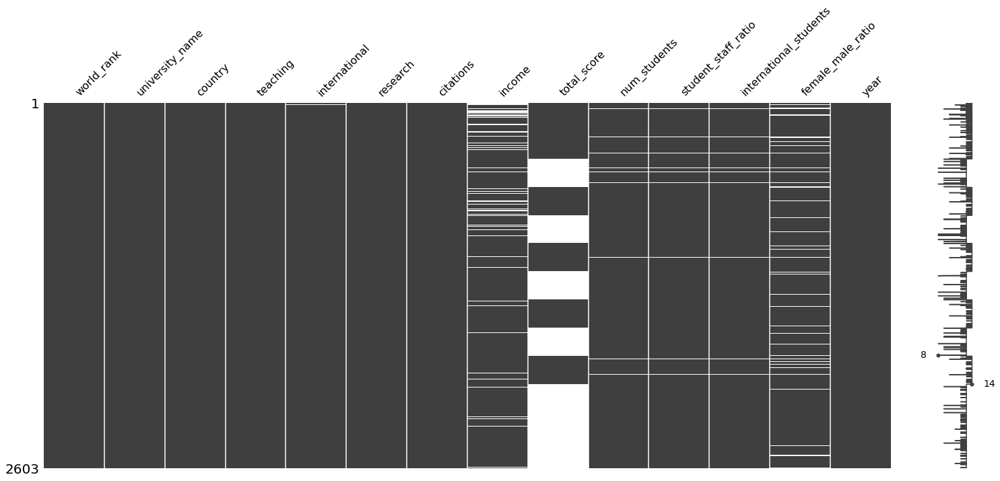

In [17]:
msn.matrix(data)  # null deyerlerin qrafiki

<AxesSubplot:>

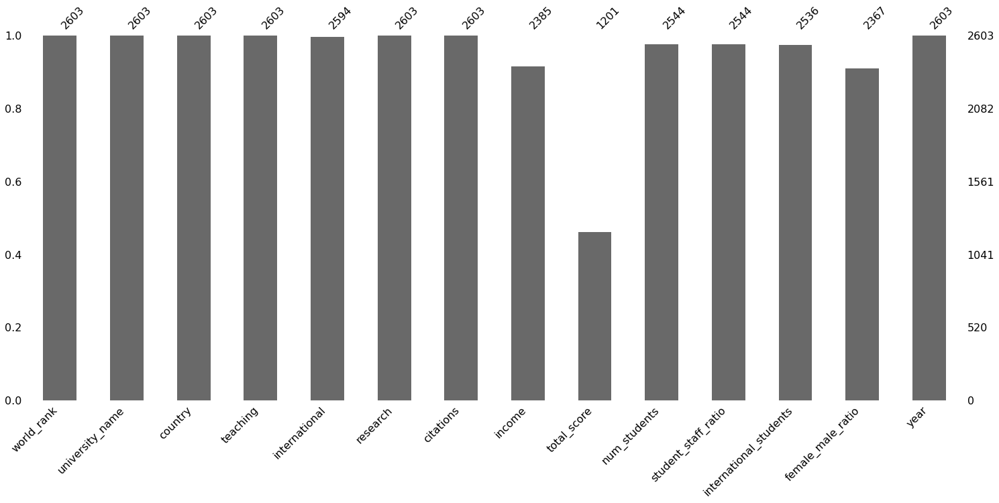

In [18]:
msn.bar(data)  # null deyerlerin qrafiki

In [19]:
# Datanin nece faizi nulldur
data.isnull().sum()/len(data)

world_rank                0.000000
university_name           0.000000
country                   0.000000
teaching                  0.000000
international             0.003458
research                  0.000000
citations                 0.000000
income                    0.083750
total_score               0.538609
num_students              0.022666
student_staff_ratio       0.022666
international_students    0.025740
female_male_ratio         0.090665
year                      0.000000
dtype: float64

In [20]:
data.isnull().sum()/data.shape[0]

world_rank                0.000000
university_name           0.000000
country                   0.000000
teaching                  0.000000
international             0.003458
research                  0.000000
citations                 0.000000
income                    0.083750
total_score               0.538609
num_students              0.022666
student_staff_ratio       0.022666
international_students    0.025740
female_male_ratio         0.090665
year                      0.000000
dtype: float64

In [21]:
# Total_score sutununu silirik  ona goreki 50% den coxdur null deyerlerin sayi 
data.drop('total_score',axis = 1 , inplace=True)

In [22]:
# Null deyerleri silirik 
data.dropna(inplace = True)

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2174 entries, 1 to 2602
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   world_rank              2174 non-null   object 
 1   university_name         2174 non-null   object 
 2   country                 2174 non-null   object 
 3   teaching                2174 non-null   float64
 4   international           2174 non-null   float64
 5   research                2174 non-null   float64
 6   citations               2174 non-null   float64
 7   income                  2174 non-null   float64
 8   num_students            2174 non-null   float64
 9   student_staff_ratio     2174 non-null   float64
 10  international_students  2174 non-null   object 
 11  female_male_ratio       2174 non-null   object 
 12  year                    2174 non-null   int64  
dtypes: float64(7), int64(1), object(5)
memory usage: 237.8+ KB


In [24]:
# international_students sutununun adini deyishmek 
data.rename(columns = {'international_students': "international_students_per"},inplace = True)

In [25]:
# international_students sutununda olan fazi isaresini cixarmaq ve tipini deyishmek
data['international_students_per'] = data['international_students_per'].map(lambda row: int(row.replace('%','')))

In [26]:
data.head()

,world_rank,university_name,country,teaching,international,research,citations,income,num_students,student_staff_ratio,international_students_per,female_male_ratio,year
1,2,California Institute of Technology,United States of America,97.7,54.6,98.0,99.9,83.7,2243.0,6.9,27,33 : 67,2011
2,3,Massachusetts Institute of Technology,United States of America,97.8,82.3,91.4,99.9,87.5,11074.0,9.0,33,37 : 63,2011
3,4,Stanford University,United States of America,98.3,29.5,98.1,99.2,64.3,15596.0,7.8,22,42 : 58,2011
5,6,University of Cambridge,United Kingdom,90.5,77.7,94.1,94.0,57.0,18812.0,11.8,34,46 : 54,2011
6,6,University of Oxford,United Kingdom,88.2,77.2,93.9,95.1,73.5,19919.0,11.6,34,46 : 54,2011


In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2174 entries, 1 to 2602
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   world_rank                  2174 non-null   object 
 1   university_name             2174 non-null   object 
 2   country                     2174 non-null   object 
 3   teaching                    2174 non-null   float64
 4   international               2174 non-null   float64
 5   research                    2174 non-null   float64
 6   citations                   2174 non-null   float64
 7   income                      2174 non-null   float64
 8   num_students                2174 non-null   float64
 9   student_staff_ratio         2174 non-null   float64
 10  international_students_per  2174 non-null   int64  
 11  female_male_ratio           2174 non-null   object 
 12  year                        2174 non-null   int64  
dtypes: float64(7), int64(2), object(4

In [28]:
# Data hansi illeri ehate edir 

In [29]:
data['year'].unique()

array([2011, 2012, 2013, 2014, 2015, 2016], dtype=int64)

In [30]:
range_year = data['year'].unique()
print(f" Data year coverage: {range_year[0]} -{range_year[1]}")

 Data year coverage: 2011 -2012


In [31]:
# Dunya siralamasinda Teacing -in lineplot-u

<AxesSubplot:xlabel='world_rank', ylabel='teaching'>

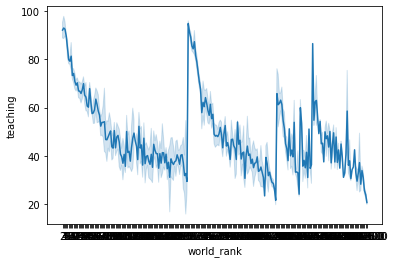

In [32]:
sns.lineplot(x='world_rank' , y='teaching',data=data)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),

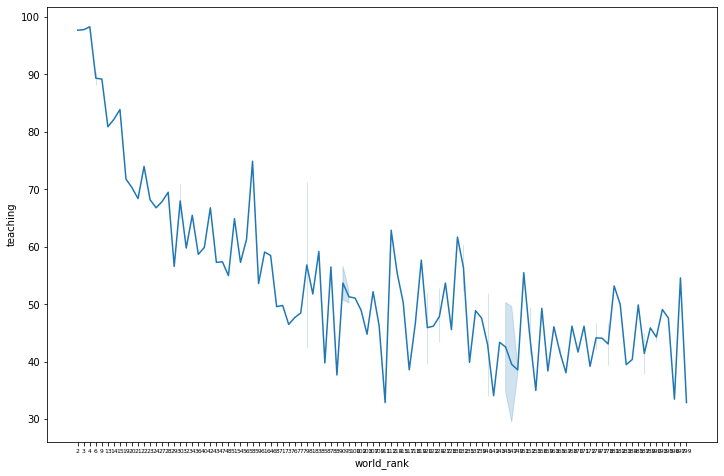

In [33]:
data_2011 = data[data['year']== 2011]

plt.figure(figsize=(12,8))
sns.lineplot(x='world_rank' , y='teaching',data=data_2011)
plt.xticks( fontsize = 6 )

In [34]:
top_100_university = data.head(100)

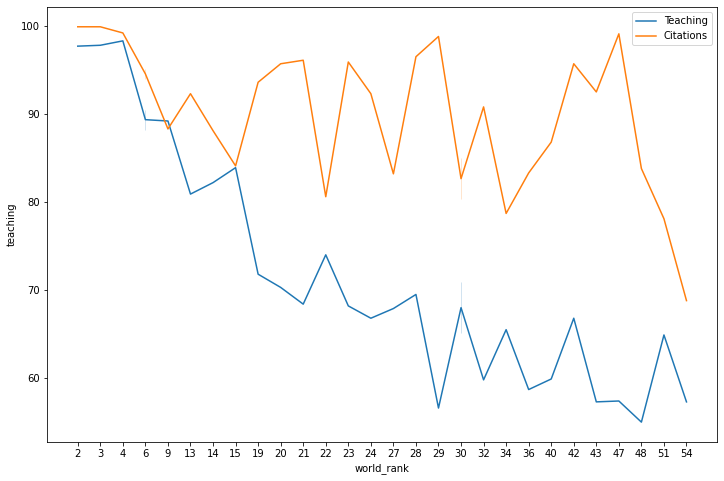

In [35]:
plt.figure(figsize=(12,8))
sns.lineplot(x='world_rank' , y='teaching',data=top_100_university.head(30),label = 'Teaching')
sns.lineplot(x='world_rank' , y='citations',data=top_100_university.head(30),label = 'Citations')
plt.legend()

In [36]:
# Universitetin dunya siralamasi azaldiqca  teaching azalir ve satation az azlmir  

<AxesSubplot:xlabel='world_rank', ylabel='international_students_per'>

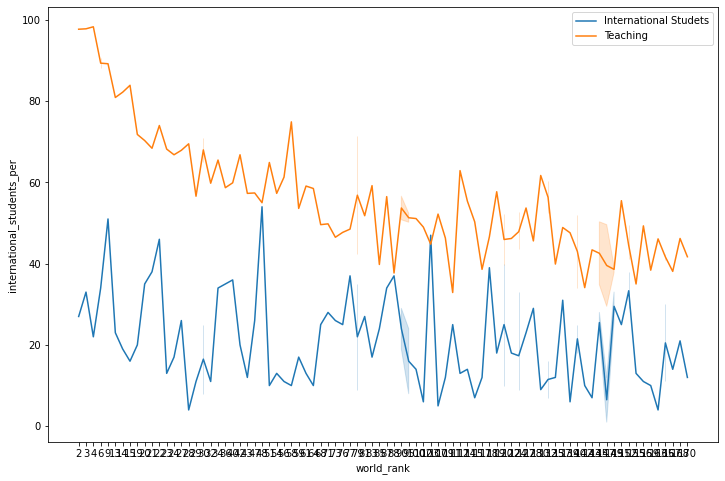

In [37]:
plt.figure(figsize=(12,8))
sns.lineplot(x='world_rank' , y='international_students_per',data=top_100_university,label = 'International Studets')
sns.lineplot(x='world_rank' , y='teaching',data=top_100_university,label = 'Teaching')

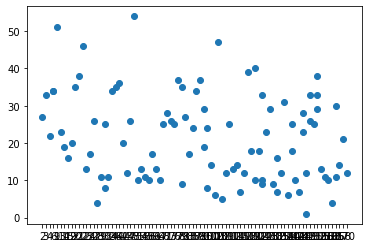

In [38]:
plt.scatter(x=top_100_university['world_rank'], y = top_100_university['international_students_per'])

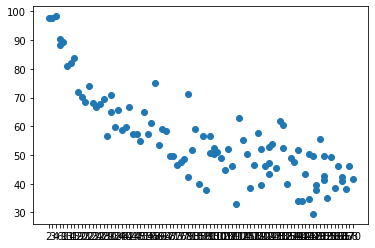

In [39]:
plt.scatter(x=top_100_university['world_rank'], y = top_100_university['teaching'])

In [40]:
# USA -de iller uzre nece universiteti var  
usa_data =data[data['country'] == 'United States of America']

In [41]:
usa_count=usa_data.groupby('year')['world_rank'].count()

<AxesSubplot:xlabel='year'>

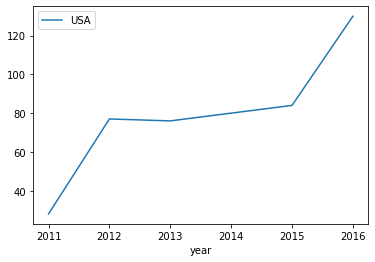

In [42]:
sns.lineplot(x=usa_count.index , y=usa_count.values ,label = 'USA')

In [43]:
# Butun olkelerde iller uzre nece universiteti var  
countries = data['country'].unique()

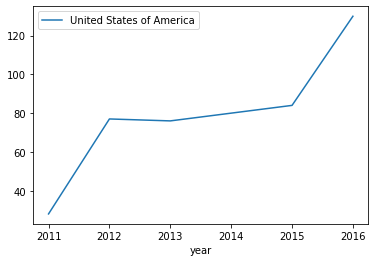

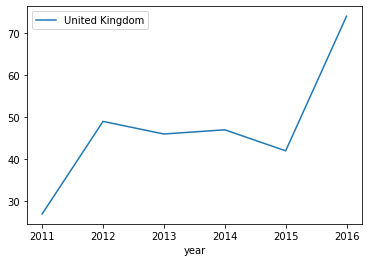

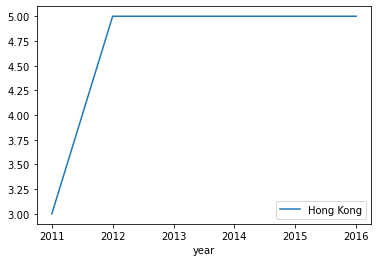

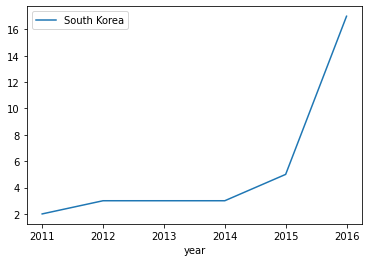

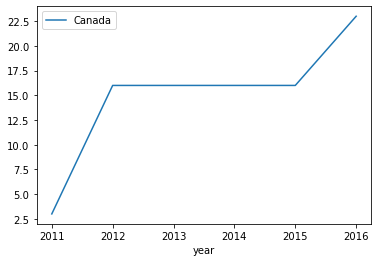

...

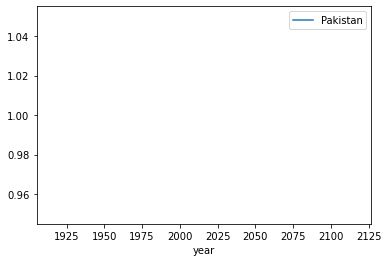

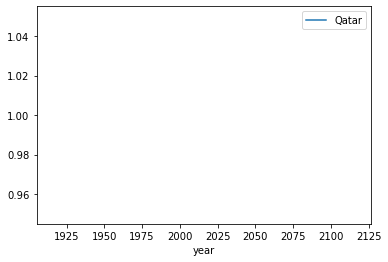

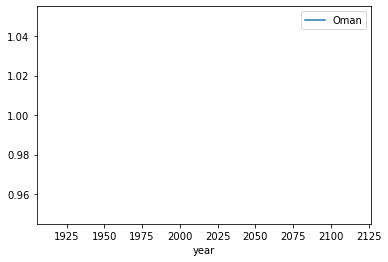

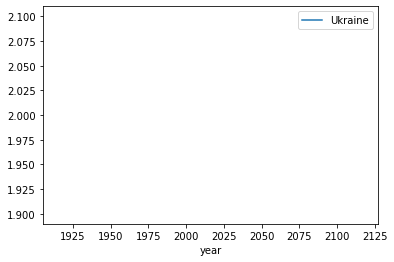

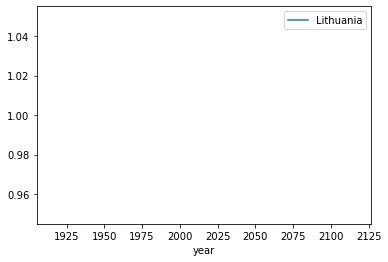

In [44]:
for country in countries:
    country_data  = data[data['country'] == country]
    country_count = country_data.groupby('year')['world_rank'].count()
    sns.lineplot(x=country_count.index , y=country_count.values ,label = country)
    plt.show()

In [45]:
# MIT universitetini iller uzre reytingde deyisimi 

<AxesSubplot:xlabel='year', ylabel='world_rank'>

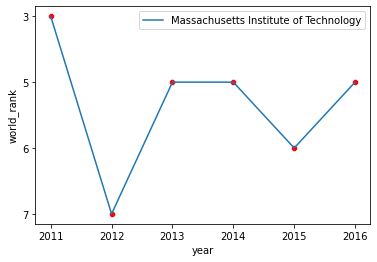

In [46]:
mit_data =data[data['university_name'] == 'Massachusetts Institute of Technology']
mit_data.sort_values('world_rank',inplace=True)
sns.lineplot(x=mit_data['year'] , y=mit_data['world_rank'],label = 'Massachusetts Institute of Technology')
sns.scatterplot(x=mit_data['year'] , y=mit_data['world_rank'], color='red')

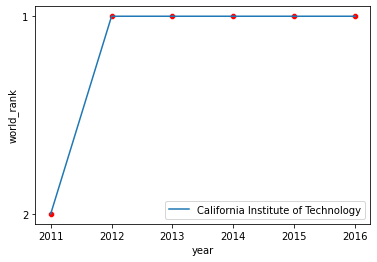

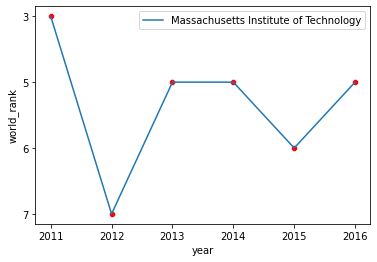

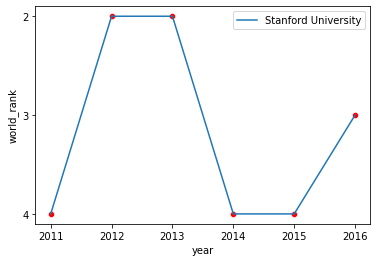

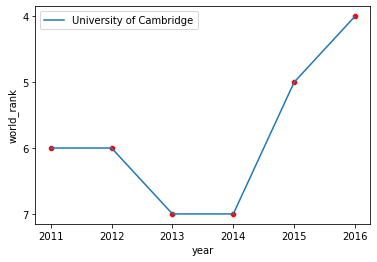

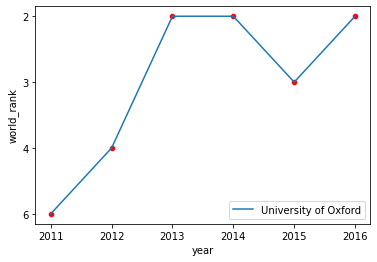

...

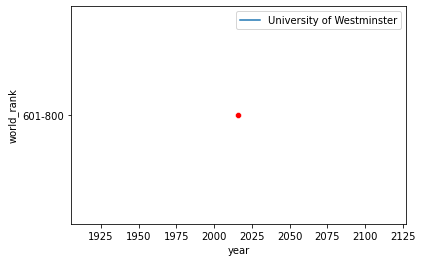

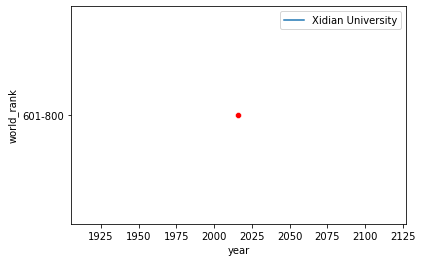

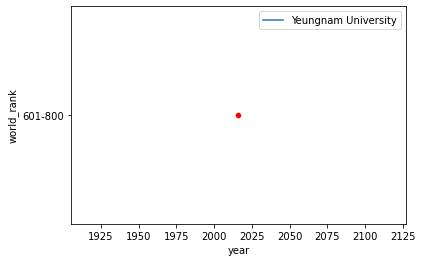

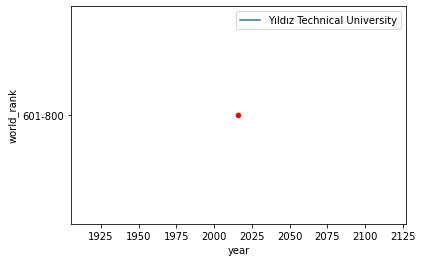

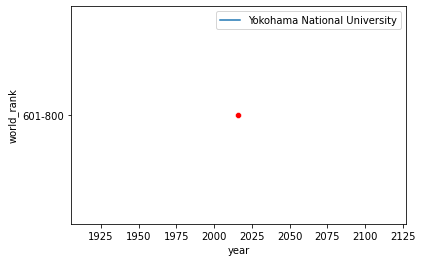

In [47]:
# Her universitetin iller uzre reytingde deyisimi 
universities = countries = data['university_name'].unique()

for university in universities:
    
    university_data = data[data['university_name'] == university]
    university_data.sort_values('world_rank',inplace = True)
    sns.lineplot(x = university_data['year'] , y = university_data['world_rank'], label = university)
    sns.scatterplot(x = university_data['year'] , y = university_data['world_rank'], color ='red')
    plt.show()
    

<AxesSubplot:xlabel='world_rank', ylabel='research'>

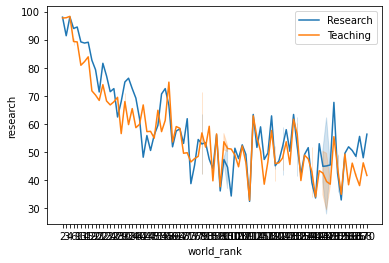

In [48]:
sns.lineplot(x = 'world_rank' , y = 'research', data=top_100_university,  label = 'Research')
sns.lineplot(x = 'world_rank' , y = 'teaching', data=top_100_university,  label = 'Teaching')

In [49]:
# Hansi olkelerden ne qeder universitet dunya siralamasina gire bilir (xerite versiyasi)   
# Famale: Male ratio uzeride islemek 